# **Stable Diffusion** 


Stable Diffusion is a text-to-image latent diffusion model created by the researchers and engineers from [CompVis](https://github.com/CompVis), [Stability AI](https://stability.ai/) and [LAION](https://laion.ai/). It's trained on 512x512 images from a subset of the [LAION-5B](https://laion.ai/blog/laion-5b/) database. This model uses a frozen CLIP ViT-L/14 text encoder to condition the model on text prompts. With its 860M UNet and 123M text encoder, the model is relatively lightweight and runs on a GPU with at least 10GB VRAM.
See the [model card](https://huggingface.co/CompVis/stable-diffusion) for more information.

This Colab notebook shows how to use Stable Diffusion with the 🤗 Hugging Face [🧨 Diffusers library](https://github.com/huggingface/diffusers). It consists of:

- **Text-to-Image Generation**
- **Image-to-Image Text-Guided Generation**
- **Text-Guided Image Inpainting**

### Reference
- https://github.com/huggingface/diffusers/tree/main/src/diffusers/pipelines/stable_diffusion

In [1]:
import torch
from diffusers import (
    StableDiffusionPipeline,
    StableDiffusionImg2ImgPipeline,
    StableDiffusionInpaintPipeline,
    AutoencoderKL,
    UNet2DConditionModel,
    DDIMScheduler
)
from transformers import CLIPTextModel, CLIPTokenizer
import numpy as np
import math
from PIL import Image
from tqdm.auto import tqdm

In [2]:
device = "cuda"
model_path = "CompVis/stable-diffusion-v1-4" # you can download the model weights and save locally

## **Text-to-Image Generation**

###  Text-to-Image Generation with `StableDiffusionPipeline`

Firstly, we use `StableDiffusionPipeline` to generate images from text with just a few lines of code.

In [3]:
# load Stable Diffusion Pipeline
pipe = StableDiffusionPipeline.from_pretrained(
    model_path,
    torch_dtype=torch.float16, # use fp16
).to(device)

In [4]:
def image_grid(imgs, rows, cols):
    assert len(imgs) == rows*cols

    w, h = imgs[0].size
    grid = Image.new('RGB', size=(cols*w, rows*h))
    grid_w, grid_h = grid.size
    
    for i, img in enumerate(imgs):
        grid.paste(img, box=(i%cols*w, i//cols*h))
    return grid

  0%|          | 0/51 [00:00<?, ?it/s]

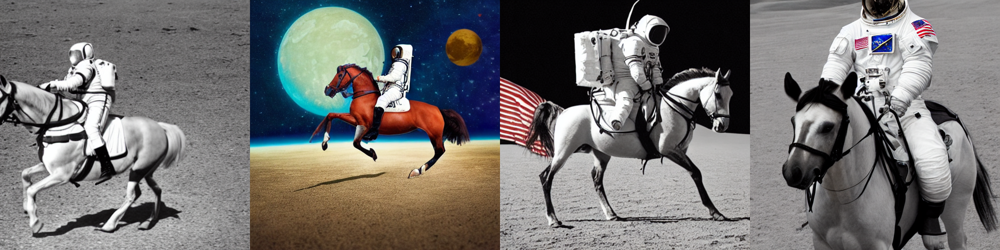

In [5]:
prompt = ["a photograph of an astronaut riding a horse"]

height = 512                        # default height of Stable Diffusion
width = 512                         # default width of Stable Diffusion
num_inference_steps = 50            # Number of denoising steps
guidance_scale = 7.5                # Scale for classifier-free guidance
num_samples = 4
num_rows = 1

# Seed generator to create the inital latent noise
generator = torch.Generator(device).manual_seed(2022)

all_images = []
for _ in range(num_rows):
    images = pipe(
        prompt,
        num_images_per_prompt=num_samples,
        height=height,
        width=width,
        num_inference_steps=num_inference_steps,
        guidance_scale=guidance_scale,
        generator=generator,
    ).images
    all_images.extend(images)

grid = image_grid(all_images, num_rows, num_samples)
grid

### Generate non-square images

Stable Diffusion produces images of `512 × 512` pixels by default. But it's very easy to override the default using the `height` and `width` arguments, so you can create rectangular images in portrait or landscape ratios.

These are some recommendations to choose good image sizes:
- Make sure `height` and `width` are both multiples of `8`.
- Going below 512 might result in lower quality images.
- **Going over 512 in both directions will repeat image areas (global coherence is lost).**
- The best way to create non-square images is to use `512` in one dimension, and a value larger than that in the other one.

  0%|          | 0/51 [00:00<?, ?it/s]

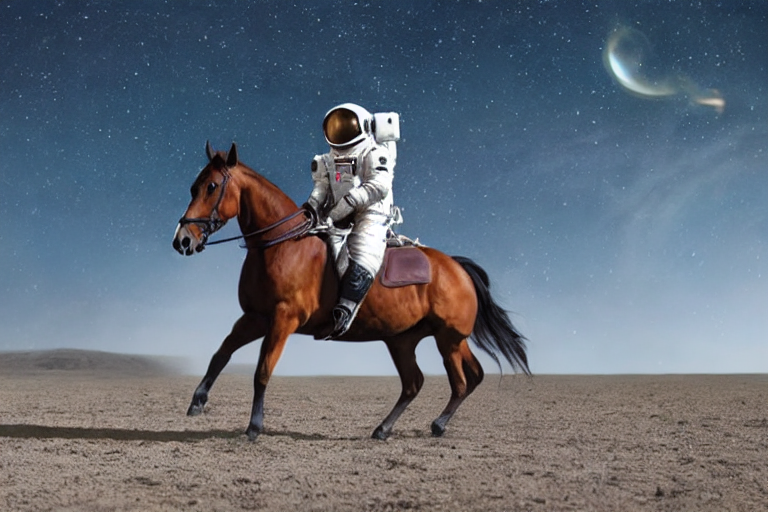

In [6]:
prompt = "a photograph of an astronaut riding a horse"
generator = torch.Generator(device).manual_seed(1)

image = pipe(prompt, height=512, width=768, generator=generator).images[0]
image

In [7]:
if torch.cuda.is_available():
    torch.cuda.empty_cache()

### Dive into `StableDiffusionPipeline`.
Next, we will dive into the `StableDiffusionPipeline`.

The [pre-trained model](https://huggingface.co/CompVis/stable-diffusion-v1-3-diffusers/tree/main) includes all the components required to setup a complete diffusion pipeline. They are stored in the following folders:
- `text_encoder`: Stable Diffusion uses CLIP, but other diffusion models may use other encoders such as `BERT`.
- `tokenizer`. It must match the one used by the `text_encoder` model.
- `scheduler`: The scheduling algorithm used to progressively add noise to the image during training.
- `unet`: The model used to generate the latent representation of the input.
- `vae`: Autoencoder module that we'll use to decode latent representations into real images.

We can load the components by referring to the folder they were saved, using the `subfolder` argument to `from_pretrained`. Then, we can use the stable diffusion pipeline to generate images given text prompts:
![sd-pipeline](assets/sd.png)

In [8]:
# 1. Load the autoencoder model which will be used to decode the latents into image space. 
vae = AutoencoderKL.from_pretrained(model_path, subfolder="vae")

# 2. Load the tokenizer and text encoder to tokenize and encode the text. 
tokenizer = CLIPTokenizer.from_pretrained(model_path, subfolder="tokenizer")
text_encoder = CLIPTextModel.from_pretrained(model_path, subfolder="text_encoder")

# 3. The UNet model for generating the latents.
unet = UNet2DConditionModel.from_pretrained(model_path, subfolder="unet")

# 4. Define noise scheduler: the parameters must match the original stable diffusion
noise_scheduler = DDIMScheduler(
    num_train_timesteps=1000,
    beta_start=0.00085,
    beta_end=0.012,
    beta_schedule="scaled_linear",
    clip_sample=False, # don't clip sample, the x0 in stable diffusion not in range [-1, 1]
    set_alpha_to_one=False,
    steps_offset=1,
)

# Next we move the models to the GPU.
vae = vae.to(device)
text_encoder = text_encoder.to(device)
unet = unet.to(device) 

In [9]:
prompt = [
    "A dragon fruit wearing karate belt in the snow",
    "A small cactus wearing a straw hat and neon sunglasses in the Sahara desert",
    "A photo of a raccoon wearing an astronaut helmet, looking out of the window at night",
    "A cute otter in a rainbow whirlpool holding shells, watercolor"
]

height = 512                        # default height of Stable Diffusion
width = 512                         # default width of Stable Diffusion
num_inference_steps = 50            # Number of denoising steps
guidance_scale = 7.5                # Scale for classifier-free guidance

# Seed generator to create the inital latent noise
generator = torch.Generator(device).manual_seed(0)

batch_size = 4

In [10]:
# Get the text_embeddings for the prompt
text_input = tokenizer(prompt, padding="max_length", max_length=tokenizer.model_max_length, truncation=True, return_tensors="pt")
with torch.no_grad():
    text_embeddings = text_encoder(text_input.input_ids.to(device))[0]
# Get the unconditional text embeddings for classifier-free guidance
max_length = text_input.input_ids.shape[-1]
uncond_input = tokenizer(
    [""] * batch_size, padding="max_length", max_length=max_length, return_tensors="pt"
)
with torch.no_grad():
      uncond_embeddings = text_encoder(uncond_input.input_ids.to(device))[0]
# Concatenate both into a single batch
text_embeddings = torch.cat([uncond_embeddings, text_embeddings])

# Generate the intial random noise
latents = torch.randn(
    (batch_size, unet.in_channels, height // 8, width // 8),
    generator=generator, device=device
)
latents = latents.to(device)

# Set inference steps for the noise scheduler
noise_scheduler.set_timesteps(num_inference_steps)

# scale the initial noise by the standard deviation required by the scheduler
latents = latents * noise_scheduler.init_noise_sigma # for DDIM, init_noise_sigma = 1.0

# It's more optimized to move all timesteps to correct device beforehand
timesteps_tensor = noise_scheduler.timesteps.to(device)

# Do denoise steps
for t in tqdm(timesteps_tensor):
    # expand the latents if we are doing classifier-free guidance to avoid doing two forward passes.
    latent_model_input = torch.cat([latents] * 2)
    latent_model_input = noise_scheduler.scale_model_input(latent_model_input, t) # for DDIM, do nothing

    # predict the noise
    with torch.no_grad():
        noise_pred = unet(latent_model_input, t, encoder_hidden_states=text_embeddings).sample

    # perform guidance
    noise_pred_uncond, noise_pred_text = noise_pred.chunk(2)
    noise_pred = noise_pred_uncond + guidance_scale * (noise_pred_text - noise_pred_uncond)

    # compute the previous noisy sample x_t -> x_t-1
    latents = noise_scheduler.step(noise_pred, t, latents).prev_sample
    
# scale and decode the image latents with vae
latents = 1 / 0.18215 * latents

with torch.no_grad():
    image = vae.decode(latents).sample

  0%|          | 0/50 [00:00<?, ?it/s]

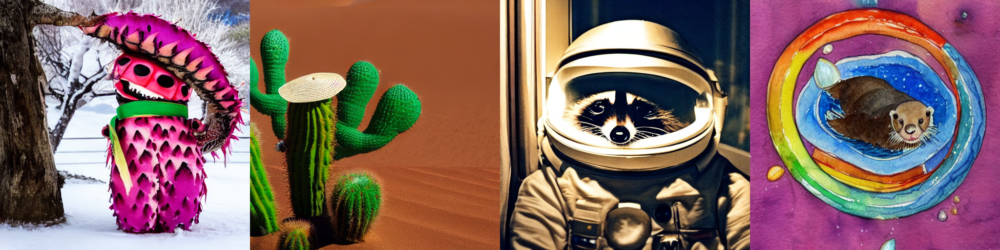

In [11]:
image = (image / 2 + 0.5).clamp(0, 1)
image = image.detach().cpu().permute(0, 2, 3, 1).numpy()
images = (image * 255).round().astype("uint8")
pil_images = [Image.fromarray(image) for image in images]

grid = image_grid(pil_images, 1, batch_size)
grid

## **Image-to-Image Text-Guided Generation**

We can use `StableDiffusionImg2ImgPipeline` to do image-to-image text-guided Generation.

In [12]:
# Clean cache
if torch.cuda.is_available():
    torch.cuda.empty_cache()
# Load pipeline
pipe = StableDiffusionImg2ImgPipeline.from_pretrained(model_path, torch_dtype=torch.float16).to(device)

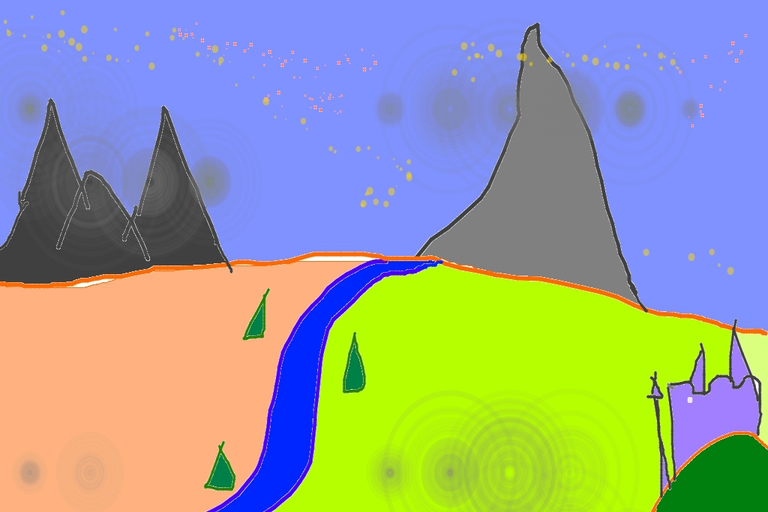

In [13]:
# Read an initial image and preprocess it so we can pass it to the pipeline.
init_img = Image.open("assets/img2img/sketch-mountains-input.jpg").convert("RGB")
init_img = init_img.resize((768, 512))
init_img

  0%|          | 0/38 [00:00<?, ?it/s]

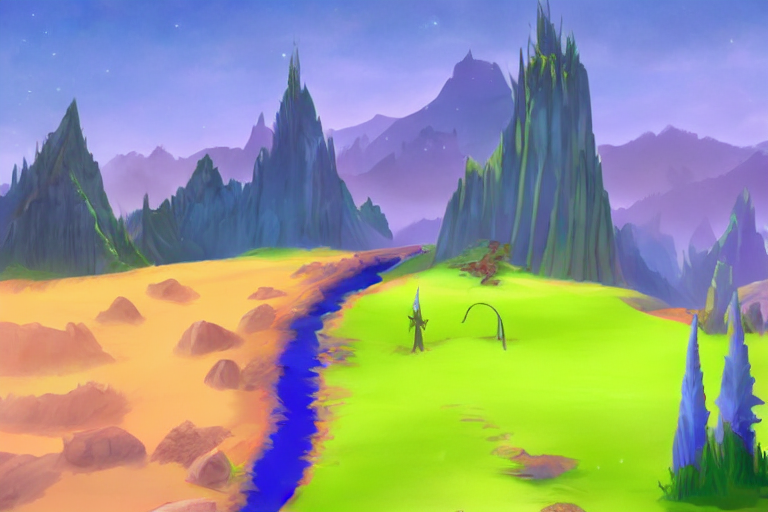

In [14]:
prompt = "A fantasy landscape, trending on artstation"
generator = torch.Generator(device=device).manual_seed(1024)

with torch.autocast("cuda"):
    image = pipe(
        prompt=prompt,
        init_image=init_img,
        strength=0.75,
        guidance_scale=7.5,
        generator=generator
    ).images[0]
image

Here, `strength` is a value between 0.0 and 1.0, that controls the amount of noise that is added to the input image. Values that approach 1.0 allow for lots of variations but will also produce images that are not semantically consistent with the input. If you use a lower value,  it can generate images that are more similar with the initial image.

  0%|          | 0/28 [00:00<?, ?it/s]

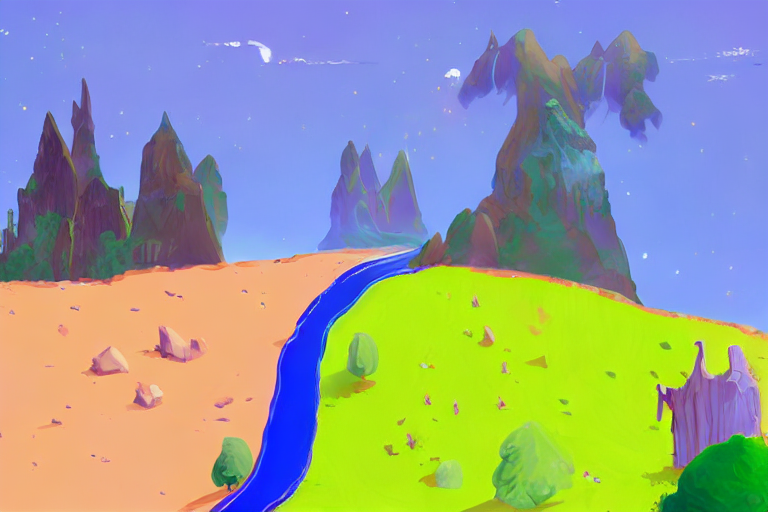

In [15]:
with torch.autocast("cuda"):
    image = pipe(
        prompt=prompt,
        init_image=init_img,
        strength=0.55,
        guidance_scale=7.5,
        generator=generator
    ).images[0]
image

Then, we dive into `StableDiffusionImg2ImgPipeline`. The algorithm behind image-to-image text-guided generation is very simple: firstly we get the latents of initial image by `vae`, then we add noise on the latents by diffusion process, and we use the noisy latents as the start latents rather than a random noise to generate a new image give a prompt. See more in the paper [SDEdit](https://arxiv.org/abs/2108.01073).

In [16]:
# Clean cache
if torch.cuda.is_available():
    torch.cuda.empty_cache()

# 1. Load the autoencoder model which will be used to decode the latents into image space. 
vae = AutoencoderKL.from_pretrained(model_path, subfolder="vae")

# 2. Load the tokenizer and text encoder to tokenize and encode the text. 
tokenizer = CLIPTokenizer.from_pretrained(model_path, subfolder="tokenizer")
text_encoder = CLIPTextModel.from_pretrained(model_path, subfolder="text_encoder")

# 3. The UNet model for generating the latents.
unet = UNet2DConditionModel.from_pretrained(model_path, subfolder="unet")

# 4. Define noise scheduler: the parameters must match the original stable diffusion
noise_scheduler = DDIMScheduler(
    num_train_timesteps=1000,
    beta_start=0.00085,
    beta_end=0.012,
    beta_schedule="scaled_linear",
    clip_sample=False, # don't clip sample, the x0 in stable diffusion not in range [-1, 1]
    set_alpha_to_one=False,
    steps_offset=1,
)

# Next we move the models to the GPU.
vae = vae.to(device)
text_encoder = text_encoder.to(device)
unet = unet.to(device) 

In [17]:
prompt = ["A fantasy landscape, trending on artstation"]

height = 512                        # default height of Stable Diffusion
width = 768                         # default width of Stable Diffusion
num_inference_steps = 50            # Number of denoising steps
guidance_scale = 7.5                # Scale for classifier-free guidance
strength = 0.75

# Seed generator to create the inital latent noise
generator = torch.Generator(device).manual_seed(1024)

batch_size = 1

# preprocess image
def preprocess(image):
    w, h = image.size
    w, h = map(lambda x: x - x % 32, (w, h))  # resize to integer multiple of 32
    image = image.resize((w, h), resample=Image.LANCZOS)
    image = np.array(image).astype(np.float32) / 255.0
    image = image[None].transpose(0, 3, 1, 2)
    image = torch.from_numpy(image)
    return 2.0 * image - 1.0

In [18]:
# Get the text_embeddings for the prompt
text_input = tokenizer(prompt, padding="max_length", max_length=tokenizer.model_max_length, truncation=True, return_tensors="pt")
with torch.no_grad():
    text_embeddings = text_encoder(text_input.input_ids.to(device))[0]
# Get the unconditional text embeddings for classifier-free guidance
max_length = text_input.input_ids.shape[-1]
uncond_input = tokenizer(
    [""] * batch_size, padding="max_length", max_length=max_length, return_tensors="pt"
)
with torch.no_grad():
      uncond_embeddings = text_encoder(uncond_input.input_ids.to(device))[0]
# Concatenate both into a single batch
text_embeddings = torch.cat([uncond_embeddings, text_embeddings])

# Set inference steps for the noise scheduler
noise_scheduler.set_timesteps(num_inference_steps)

# Preprocess the initial image
init_input = preprocess(init_img)
# encode the init image into latents and scale the latents
latents_dtype = text_embeddings.dtype
init_input = init_input.to(device=device, dtype=latents_dtype)
with torch.no_grad():
    init_latent_dist = vae.encode(init_input).latent_dist
    init_latents = init_latent_dist.sample(generator=generator)
    init_latents = 0.18215 * init_latents
# Get the original timestep using init_timestep
offset = noise_scheduler.config.get("steps_offset", 0)
init_timestep = int(num_inference_steps * strength) + offset
init_timestep = min(init_timestep, num_inference_steps)
timesteps = noise_scheduler.timesteps[-init_timestep]
timesteps = torch.tensor([timesteps] * batch_size, device=device)
# Add noise to latents using the timesteps
noise = torch.randn(init_latents.shape, generator=generator, device=device, dtype=latents_dtype)
init_latents = noise_scheduler.add_noise(init_latents, noise, timesteps)
latents = init_latents # use this as the start noise

# get the denoise timesteps: start from init_timestep not T
t_start = max(num_inference_steps - init_timestep + offset, 0)
timesteps_tensor = noise_scheduler.timesteps[t_start:].to(device)

# Do denoise steps
for t in tqdm(timesteps_tensor):
    # expand the latents if we are doing classifier-free guidance to avoid doing two forward passes.
    latent_model_input = torch.cat([latents] * 2)
    latent_model_input = noise_scheduler.scale_model_input(latent_model_input, t) # for DDIM, do nothing

    # predict the noise
    with torch.no_grad():
        noise_pred = unet(latent_model_input, t, encoder_hidden_states=text_embeddings).sample

    # perform guidance
    noise_pred_uncond, noise_pred_text = noise_pred.chunk(2)
    noise_pred = noise_pred_uncond + guidance_scale * (noise_pred_text - noise_pred_uncond)

    # compute the previous noisy sample x_t -> x_t-1
    latents = noise_scheduler.step(noise_pred, t, latents).prev_sample
    
# scale and decode the image latents with vae
latents = 1 / 0.18215 * latents

with torch.no_grad():
    image = vae.decode(latents).sample

  0%|          | 0/37 [00:00<?, ?it/s]

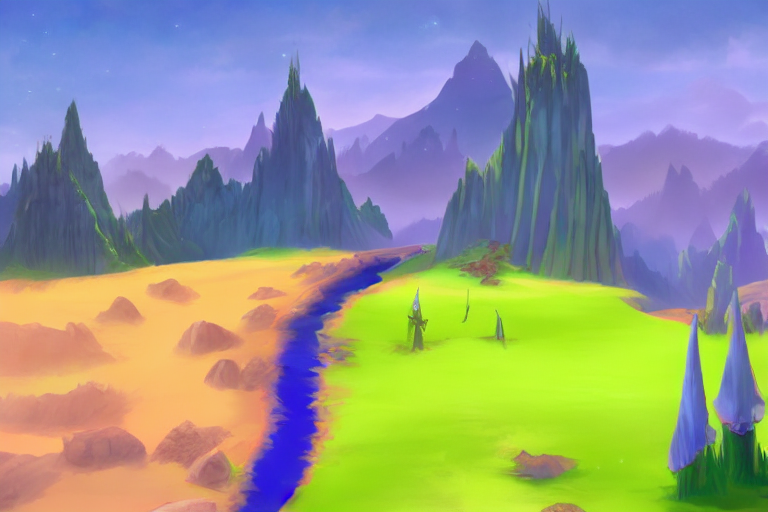

In [19]:
image = (image / 2 + 0.5).clamp(0, 1)
image = image.detach().cpu().permute(0, 2, 3, 1).numpy()
images = (image * 255).round().astype("uint8")
pil_images = [Image.fromarray(image) for image in images]

grid = image_grid(pil_images, 1, batch_size)
grid

## **Text-Guided Image Inpainting**

We can also use stable diffusion to do text-guided image inpainting: given a image and a mask, we can perform local edits with a text prompt. Here, we use `StableDiffusionInpaintPipeline` to do this task.

In [20]:
# Clean cache
if torch.cuda.is_available():
    torch.cuda.empty_cache()

# Load pipeline
pipe = StableDiffusionInpaintPipeline.from_pretrained(model_path, torch_dtype=torch.float16).to(device)

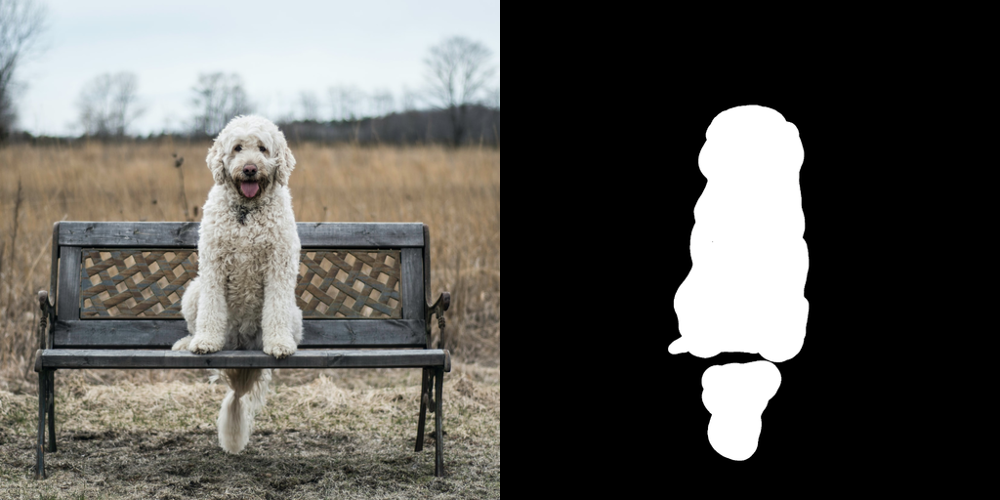

In [21]:
# Read input image and mask
input_image = Image.open("assets/inpainting_examples/overture-creations-5sI6fQgYIuo.png").resize((512, 512))
input_mask = Image.open("assets/inpainting_examples/overture-creations-5sI6fQgYIuo_mask.png").resize((512, 512))

grid = image_grid([input_image, input_mask], 1, 2)
grid

0it [00:00, ?it/s]

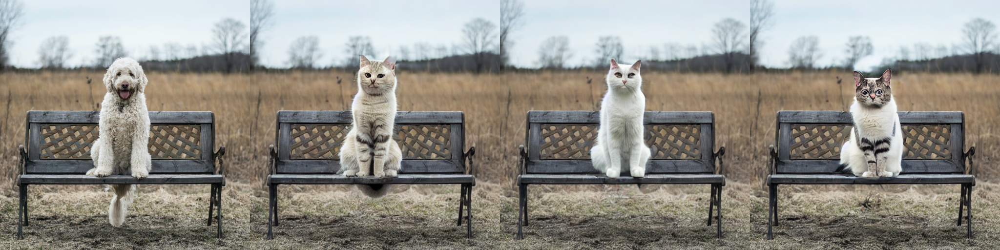

In [22]:
prompt = "a cat sitting on a bench"
strength = 0.75
guidance_scale = 7.5
num_samples = 3
num_inference_steps = 50

generator = torch.Generator(device).manual_seed(0)

with torch.autocast("cuda"):
    images = pipe(
        prompt=[prompt] * num_samples,
        init_image=input_image,
        mask_image=input_mask,
        num_inference_steps=num_inference_steps,
        strength=strength,
        guidance_scale=guidance_scale,
        generator=generator,
    ).images

grid = image_grid([input_image] + images, 1, num_samples + 1)
grid

Then, we dive into `StableDiffusionInpaintPipeline`. The algorithm behind text-guided image inpainting is also simple: firstly we can use the noisy latents from input image as the start latents just like `StableDiffusionImg2ImgPipeline`, then we should replace the known region of the image with a noise latents
from input image after each denoise step. See more in the paper [GLIDE](https://arxiv.org/abs/2112.10741) and [Blended Latent Diffusion](https://arxiv.org/abs/2206.02779).

![inpainting](assets/blend_sd.png)

In [23]:
# Clean cache
if torch.cuda.is_available():
    torch.cuda.empty_cache()

# 1. Load the autoencoder model which will be used to decode the latents into image space. 
vae = AutoencoderKL.from_pretrained(model_path, subfolder="vae")

# 2. Load the tokenizer and text encoder to tokenize and encode the text. 
tokenizer = CLIPTokenizer.from_pretrained(model_path, subfolder="tokenizer")
text_encoder = CLIPTextModel.from_pretrained(model_path, subfolder="text_encoder")

# 3. The UNet model for generating the latents.
unet = UNet2DConditionModel.from_pretrained(model_path, subfolder="unet")

# 4. Define noise scheduler: the parameters must match the original stable diffusion
noise_scheduler = DDIMScheduler(
    num_train_timesteps=1000,
    beta_start=0.00085,
    beta_end=0.012,
    beta_schedule="scaled_linear",
    clip_sample=False, # don't clip sample, the x0 in stable diffusion not in range [-1, 1]
    set_alpha_to_one=False,
    steps_offset=1,
)

# Next we move the models to the GPU.
vae = vae.to(device)
text_encoder = text_encoder.to(device)
unet = unet.to(device) 

In [24]:
prompt = "a cat sitting on a bench"
strength = 0.75
guidance_scale = 7.5
batch_size = 3
num_inference_steps = 50

generator = torch.Generator(device).manual_seed(0)

def preprocess_mask(mask):
    mask = mask.convert("L")
    w, h = mask.size
    w, h = map(lambda x: x - x % 32, (w, h))  # resize to integer multiple of 32
    mask = mask.resize((w // 8, h // 8), resample=Image.NEAREST)
    mask = np.array(mask).astype(np.float32) / 255.0
    mask = np.tile(mask, (4, 1, 1))
    mask = mask[None].transpose(0, 1, 2, 3)  # what does this step do?
    mask = 1 - mask  # repaint white, keep black
    mask = torch.from_numpy(mask)
    return mask

In [25]:
# Get the text_embeddings for the prompt
text_input = tokenizer([prompt] * batch_size, padding="max_length", max_length=tokenizer.model_max_length, truncation=True, return_tensors="pt")
with torch.no_grad():
    text_embeddings = text_encoder(text_input.input_ids.to(device))[0]
# Get the unconditional text embeddings for classifier-free guidance
max_length = text_input.input_ids.shape[-1]
uncond_input = tokenizer(
    [""] * batch_size, padding="max_length", max_length=max_length, return_tensors="pt"
)
with torch.no_grad():
      uncond_embeddings = text_encoder(uncond_input.input_ids.to(device))[0]
# Concatenate both into a single batch
text_embeddings = torch.cat([uncond_embeddings, text_embeddings])

# Set inference steps for the noise scheduler
noise_scheduler.set_timesteps(num_inference_steps)

# Preprocess the initial image
init_input = preprocess(input_image)
# encode the init image into latents and scale the latents
latents_dtype = text_embeddings.dtype
init_input = init_input.to(device=device, dtype=latents_dtype)
with torch.no_grad():
    init_latent_dist = vae.encode(init_input).latent_dist
    init_latents = init_latent_dist.sample(generator=generator)
    init_latents = 0.18215 * init_latents
# Expand init_latents for batch_size
init_latents = torch.cat([init_latents] * batch_size, dim=0)
init_latents_orig = init_latents # for blend

# preprocess mask
mask_image = preprocess_mask(input_mask)
mask_image = mask_image.to(device=device, dtype=latents_dtype)
mask = torch.cat([mask_image] * batch_size)

# Get the original timestep using init_timestep
offset = noise_scheduler.config.get("steps_offset", 0)
init_timestep = int(num_inference_steps * strength) + offset
init_timestep = min(init_timestep, num_inference_steps)
timesteps = noise_scheduler.timesteps[-init_timestep]
timesteps = torch.tensor([timesteps] * batch_size, device=device)
# Add noise to latents using the timesteps
noise = torch.randn(init_latents.shape, generator=generator, device=device, dtype=latents_dtype)
init_latents = noise_scheduler.add_noise(init_latents, noise, timesteps)
latents = init_latents # use this as the start noise

# get the denoise timesteps: start from init_timestep not T
t_start = max(num_inference_steps - init_timestep + offset, 0)
timesteps_tensor = noise_scheduler.timesteps[t_start:].to(device)

# Do denoise steps
for t in tqdm(timesteps_tensor):
    # expand the latents if we are doing classifier-free guidance to avoid doing two forward passes.
    latent_model_input = torch.cat([latents] * 2)
    latent_model_input = noise_scheduler.scale_model_input(latent_model_input, t) # for DDIM, do nothing

    # predict the noise
    with torch.no_grad():
        noise_pred = unet(latent_model_input, t, encoder_hidden_states=text_embeddings).sample

    # perform guidance
    noise_pred_uncond, noise_pred_text = noise_pred.chunk(2)
    noise_pred = noise_pred_uncond + guidance_scale * (noise_pred_text - noise_pred_uncond)

    # compute the previous noisy sample x_t -> x_t-1
    latents = noise_scheduler.step(noise_pred, t, latents).prev_sample
    
    # get noisy latents from init_latents
    init_latents_proper = noise_scheduler.add_noise(init_latents_orig, noise, torch.tensor([t]))
    # blend
    latents = (init_latents_proper * mask) + (latents * (1 - mask))
    
# scale and decode the image latents with vae
latents = 1 / 0.18215 * latents

with torch.no_grad():
    image = vae.decode(latents).sample

  0%|          | 0/37 [00:00<?, ?it/s]

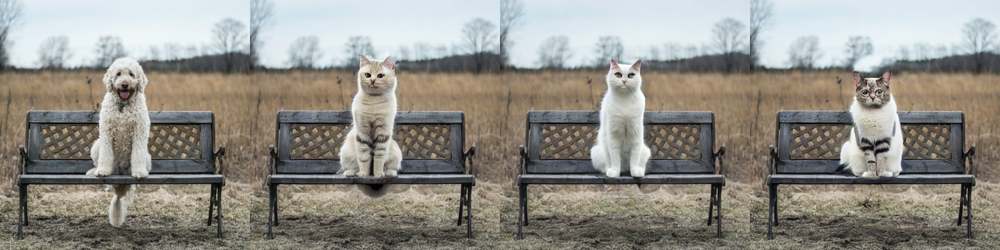

In [26]:
image = (image / 2 + 0.5).clamp(0, 1)
image = image.detach().cpu().permute(0, 2, 3, 1).numpy()
images = (image * 255).round().astype("uint8")
pil_images = [Image.fromarray(image) for image in images]

grid = image_grid([input_image] + pil_images, 1, batch_size + 1)
grid